# Visualize Textile Objects

This notebook allows you to visualize textile objects from the TeXMET dataset, focusing on those identified to have thread count information.

**Instructions:**
1. Run the first two code cells to set up the environment and load the data.
2. In the third code cell, change the `object_id_to_show` variable to any of the ObjectIDs printed in the output of the second cell.
3. Run the third cell to see the image and metadata for the selected object.

In [3]:
import json
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import re
from IPython.display import display, HTML

# Load the main dataset
print("Loading dataset...")
with open('clean_dataset/clean_textiles_dataset.json', 'r') as f:
    data = json.load(f)

# Create a DataFrame for easy lookup
df = pd.DataFrame(data)
df.set_index('objectID', inplace=True)
print("Dataset loaded successfully.")

# Load the list of objects with thread count info
object_ids_with_thread_count = []
try:
    with open('thread_count_results.txt', 'r') as f:
        content = f.read()
        # Use regex to find all ObjectID numbers
        object_ids_with_thread_count = [int(id_str) for id_str in re.findall(r'ObjectID: (\d+)', content)]
except FileNotFoundError:
    print("Error: 'thread_count_results.txt' not found. Please make sure you have run the previous script.")

if object_ids_with_thread_count:
    print(f"\nFound {len(object_ids_with_thread_count)} objects with potential thread count info.")
    print("Here are the first 10 ObjectIDs you can visualize:")
    print(object_ids_with_thread_count[:10])
else:
    print("No objects with thread count information were found.")

Loading dataset...
Dataset loaded successfully.

Found 750 objects with potential thread count info.
Here are the first 10 ObjectIDs you can visualize:
[229452, 229763, 229762, 229761, 229764, 229765, 226602, 226603, 231896, 231895]


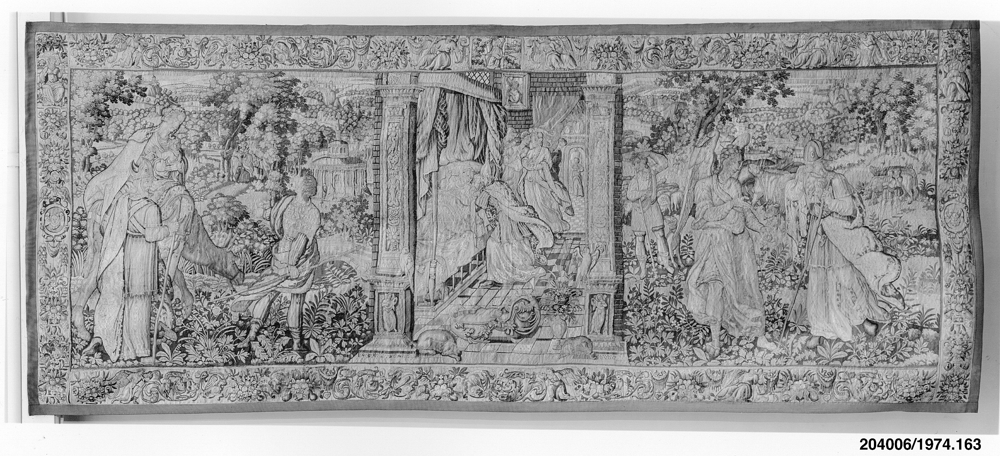

In [4]:
def display_object(object_id):
    """Fetches and displays the metadata and image for a given objectID."""
    if object_id not in df.index:
        print(f"Object with ID {object_id} not found in the dataset.")
        return
    
    # Get the object's data
    obj = df.loc[object_id]
    
    # Display metadata
    display(HTML(f"<h2>Object Details for ID: {object_id}</h2>"))
    dimensions_html = obj.get('dimensions', 'N/A').replace('\r\n', '<br>')
    meta_html = f"""
    <b>Department:</b> {obj.get('department', 'N/A')}<br>
    <b>Medium:</b> {obj.get('medium', 'N/A')}<br>
    <b>Dimensions:</b> {dimensions_html}<br>
    <b>Object URL:</b> <a href='{obj.get('objectURL')}' target='_blank'>{obj.get('objectURL')}</a>
    """
    display(HTML(meta_html))
    
    # Get and display the primary image
    image_url = obj.get('primaryImage')
    if image_url:
        try:
            response = requests.get(image_url)
            response.raise_for_status() # raise an exception for bad status codes
            img = Image.open(BytesIO(response.content))
            display(img)
        except requests.exceptions.RequestException as e:
            print(f"Error fetching image: {e}")
    else:
        print("No primary image URL found for this object.")

# --- CHANGE THE ID HERE ---
# Copy an ObjectID from the list printed above and paste it here.
object_id_to_show = 229452 # Example ID

if object_ids_with_thread_count:
    # You can replace the example ID with any from the list.
    if object_id_to_show not in object_ids_with_thread_count:
        print(f"Warning: The selected object ID {object_id_to_show} was not in the list of objects with thread count info.")
    display_object(object_id_to_show)
else:
    print("Cannot display object as no IDs with thread count info were loaded.")

### Visualize a few more examples

Displaying the first 3 objects from the list as examples...


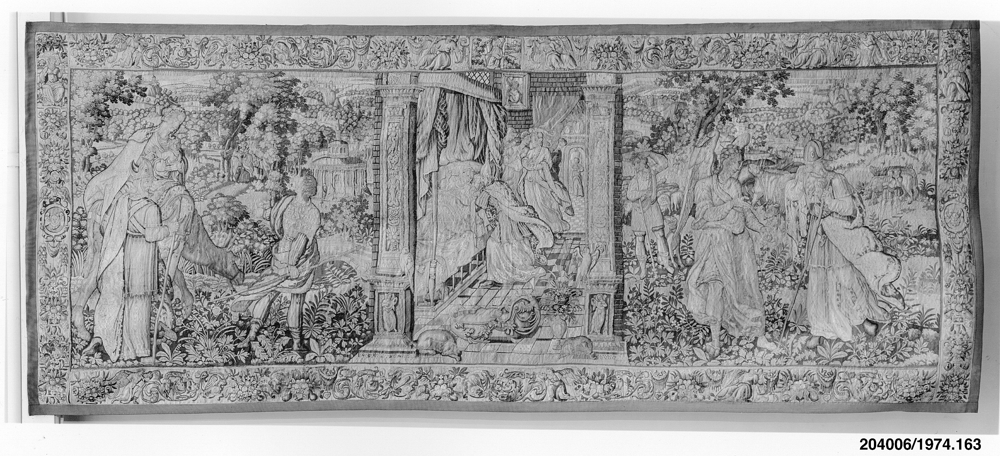

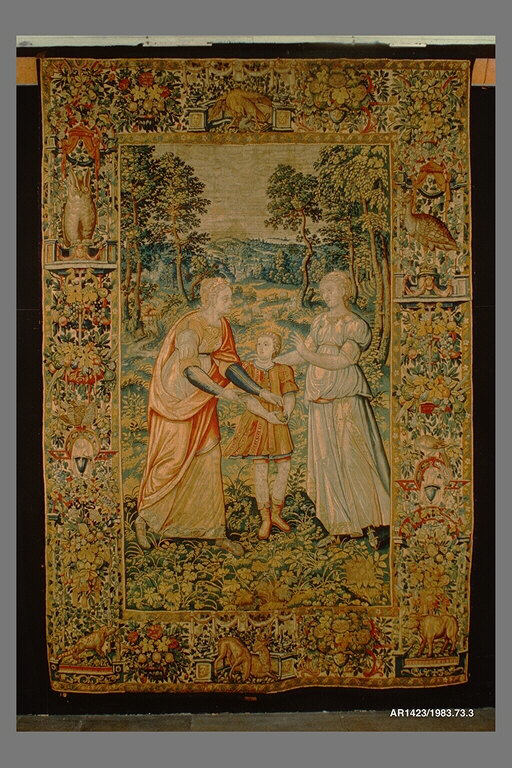

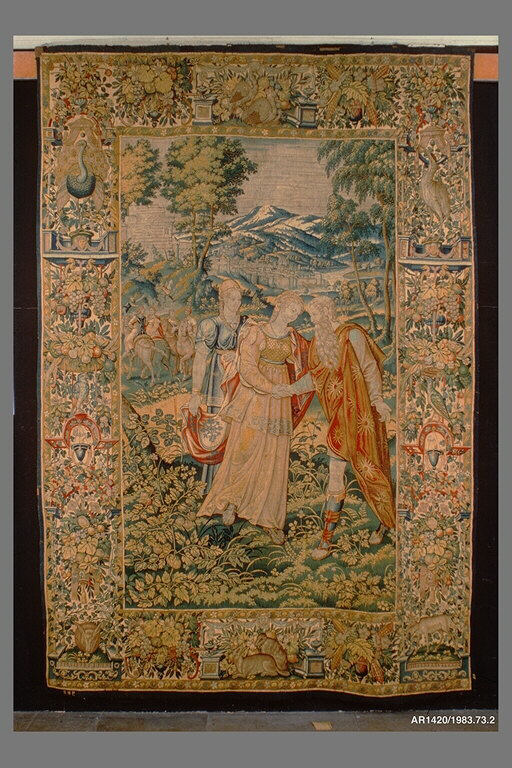

In [5]:
if object_ids_with_thread_count:
    print("Displaying the first 3 objects from the list as examples...")
    for obj_id in object_ids_with_thread_count[:3]:
        display_object(obj_id)
        display(HTML("<hr>")) # Add a separator